# Load Dataset

In [36]:
from datasets import load_from_disk
import os

# Specify the path to the dataset on your machine
path_to_dataset = "~/Downloads/genecorpus_30M_2048.dataset"
path = os.path.expanduser(path_to_dataset)

# Load the dataset from disk
genecorpus = load_from_disk(path_to_dataset)

FileNotFoundError: Directory ~/Downloads/genecorpus_30M_2048.dataset not found

In [ ]:
genecorpus

Dataset({
    features: ['input_ids', 'length'],
    num_rows: 27406216
})

In [ ]:
sub_genecorpus = genecorpus.shuffle(seed=42).select(i for i in list(range(1000)))

Parameter 'indices'=<generator object <genexpr> at 0x103bc1490> of the transform datasets.arrow_dataset.Dataset.select couldn't be hashed properly, a random hash was used instead. Make sure your transforms and parameters are serializable with pickle or dill for the dataset fingerprinting and caching to work. If you reuse this transform, the caching mechanism will consider it to be different from the previous calls and recompute everything. This warning is only showed once. Subsequent hashing failures won't be showed.


In [ ]:
sub_genecorpus

Dataset({
    features: ['input_ids', 'length'],
    num_rows: 1000
})

In [ ]:
sub_genecorpus

Dataset({
    features: ['input_ids', 'length'],
    num_rows: 1000
})

In [ ]:
for ids in sub_genecorpus:
    print(ids)

{'input_ids': [6751, 11578, 5918, 4500, 5707, 16979, 6705, 17226, 7143, 2111, 17729, 13279, 3835, 2818, 3245, 5930, 17596, 12069, 7068, 16725, 16025, 13705, 1206, 17247, 8984, 17168, 10570, 7414, 2027, 3593, 4264, 15453, 5613, 11898, 15997, 6309, 8127, 4458, 21528, 998, 5631, 5405, 20613, 15699, 12628, 13230, 12556, 10381, 8487, 1892, 12716, 14334, 267, 9724, 11027, 14127, 10245, 4128, 3293, 5660, 14823, 1765, 5239, 17200, 12087, 9627, 12356, 11883, 20511, 23948, 5021, 11916, 2804, 217, 13173, 2163, 5750, 20390, 16362, 11337, 12618, 7076, 14335, 13150, 13095, 8974, 7622, 15376, 7204, 16648, 4761, 12929, 16906, 9959, 12827, 7555, 23110, 24529, 4947, 2713, 8065, 15479, 14705, 19618, 17877, 17297, 5906, 722, 13932, 13608, 15193, 7025, 23872, 4626, 11695, 11159, 10892, 3783, 5822, 8416, 15596, 6185, 12599, 17295, 17236, 19635, 1010, 6106, 10591, 10510, 9213, 8388, 14813, 10455, 4370, 10432, 18569, 16154, 13113, 2609, 1724, 8318, 18789, 13714, 9925, 2642, 1410, 13619, 10128, 6709, 8618, 230

In [ ]:
sub_genecorpus[0]['length']

886

In [ ]:
sub_genecorpus[0]['input_ids']

6751

In [ ]:
max_value = []
max_order = []
mv = 0

for row in range(len(sub_genecorpus)):
    max_order.append(row)
    
    for column in range(sub_genecorpus[row]['length']):
        mv_candidate = sub_genecorpus[row]['input_ids'][column]
        if mv_candidate >= mv:
            mv = mv_candidate
    
    max_value.append(mv)

In [ ]:
max(max_value)

25424

In [ ]:
print('order {}'.format(max_order))
print('value {}'.format(max_value))

order [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220

# Vocabulary

In [ ]:
import pickle
import os

# Specify the path to your .pkl file
file_path = "~/Downloads/geneformer_token_dictionary.pkl"
pkl_path = os.path.expanduser(file_path)

# Open the .pkl file for reading in binary mode
with open(pkl_path, 'rb') as file:
    # Load the object from the file
    vocabulary_token_dictionary = pickle.load(file)

max_length = max(len(keys) for keys in vocabulary_token_dictionary.keys())

# Now, your_loaded_object contains the data from the .pkl file
for keys, items in vocabulary_token_dictionary.items():
    print('Gene_ID {:<{width}} Token {}'.format(keys, items, width=max_length))

Gene_ID <pad>           Token 0
Gene_ID <mask>          Token 1
Gene_ID ENSG00000000003 Token 2
Gene_ID ENSG00000000005 Token 3
Gene_ID ENSG00000000419 Token 4
Gene_ID ENSG00000000457 Token 5
Gene_ID ENSG00000000460 Token 6
Gene_ID ENSG00000000938 Token 7
Gene_ID ENSG00000000971 Token 8
Gene_ID ENSG00000001036 Token 9
Gene_ID ENSG00000001084 Token 10
Gene_ID ENSG00000001167 Token 11
Gene_ID ENSG00000001460 Token 12
Gene_ID ENSG00000001461 Token 13
Gene_ID ENSG00000001497 Token 14
Gene_ID ENSG00000001561 Token 15
Gene_ID ENSG00000001617 Token 16
Gene_ID ENSG00000001626 Token 17
Gene_ID ENSG00000001629 Token 18
Gene_ID ENSG00000001630 Token 19
Gene_ID ENSG00000001631 Token 20
Gene_ID ENSG00000002016 Token 21
Gene_ID ENSG00000002330 Token 22
Gene_ID ENSG00000002549 Token 23
Gene_ID ENSG00000002586 Token 24
Gene_ID ENSG00000002587 Token 25
Gene_ID ENSG00000002726 Token 26
Gene_ID ENSG00000002745 Token 27
Gene_ID ENSG00000002746 Token 28
Gene_ID ENSG00000002822 Token 29
Gene_ID ENSG00000002

In [ ]:
model_input_names

['input_ids']

In [ ]:
import pickle
import os

# Specify the path to your .pkl file
file_path = "~/Downloads/gene_name_id_dict.pkl"
pkl_path = os.path.expanduser(file_path)

# Open the .pkl file for reading in binary mode
with open(pkl_path, 'rb') as file:
    # Load the object from the file
    vocabulary_gene_name_id = pickle.load(file)

# Find the maximum length of gene names
max_gene_name_length = max(len(gene_name) for gene_name in vocabulary_gene_name_id.keys())

# Now, your_loaded_object contains the data from the .pkl file
for keys, items in vocabulary_gene_name_id.items():
    print('Gene_Name {:<{width}} Gene_ID {}'.format(keys, items, width=max_gene_name_length))

Gene_Name MT-TF                     Gene_ID ENSG00000210049
Gene_Name MT-RNR1                   Gene_ID ENSG00000211459
Gene_Name MT-TV                     Gene_ID ENSG00000210077
Gene_Name MT-RNR2                   Gene_ID ENSG00000210082
Gene_Name MT-TL1                    Gene_ID ENSG00000209082
Gene_Name MT-ND1                    Gene_ID ENSG00000198888
Gene_Name MT-TI                     Gene_ID ENSG00000210100
Gene_Name MT-TQ                     Gene_ID ENSG00000210107
Gene_Name MT-TM                     Gene_ID ENSG00000210112
Gene_Name MT-ND2                    Gene_ID ENSG00000198763
Gene_Name MT-TW                     Gene_ID ENSG00000210117
Gene_Name MT-TA                     Gene_ID ENSG00000210127
Gene_Name MT-TN                     Gene_ID ENSG00000210135
Gene_Name MT-TC                     Gene_ID ENSG00000210140
Gene_Name MT-TY                     Gene_ID ENSG00000210144
Gene_Name MT-CO1                    Gene_ID ENSG00000198804
Gene_Name MT-TS1                    Gene

In [ ]:
import pickle
import os

# Specify the path to your .pkl file
file_path = "~/Downloads/geneformer_gene_median_dictionary.pkl"
pkl_path = os.path.expanduser(file_path)

# Open the .pkl file for reading in binary mode
with open(pkl_path, 'rb') as file:
    # Load the object from the file
    vocabulary_gene_median = pickle.load(file)
    
max_length_median = max(len(str(vocabulary_gene_median[keys])) for keys in vocabulary_gene_median.keys())

# Now, your_loaded_object contains the data from the .pkl file
for keys, items in vocabulary_gene_median.items():
    print('Gene_ID {} Gene_Median {:<{width}}'.format(keys, items, width=max_length_median))

Gene_ID ENSG00000000003 Gene_Median 2.001186019549122  
Gene_ID ENSG00000000005 Gene_Median 3.2282132031640383 
Gene_ID ENSG00000000419 Gene_Median 2.218873777678385  
Gene_ID ENSG00000000457 Gene_Median 3.7923348732758737 
Gene_ID ENSG00000000460 Gene_Median 2.348520948900473  
Gene_ID ENSG00000000938 Gene_Median 3.6523609233116896 
Gene_ID ENSG00000000971 Gene_Median 4.125091814103064  
Gene_ID ENSG00000001036 Gene_Median 1.7514524716218405 
Gene_ID ENSG00000001084 Gene_Median 2.4156348393662945 
Gene_ID ENSG00000001167 Gene_Median 2.1358156567181648 
Gene_ID ENSG00000001460 Gene_Median 2.061695265270317  
Gene_ID ENSG00000001461 Gene_Median 2.6187784630312465 
Gene_ID ENSG00000001497 Gene_Median 1.9663485923180597 
Gene_ID ENSG00000001561 Gene_Median 2.4441504114207344 
Gene_ID ENSG00000001617 Gene_Median 3.309488427821417  
Gene_ID ENSG00000001626 Gene_Median 4.027858975050529  
Gene_ID ENSG00000001629 Gene_Median 5.861882250538956  
Gene_ID ENSG00000001630 Gene_Median 3.2048674023

In [ ]:
a = dict(zip(list(vocabulary_gene_median.keys()), [True] * len(list(vocabulary_gene_median))))

In [ ]:
a.get(i, False)

In [ ]:
# Specify the path to your .pkl file
file_path = "~/Downloads/genecorpus_30M_2048_lengths.pkl"
pkl_path = os.path.expanduser(file_path)

# Open the .pkl file for reading in binary mode
with open(pkl_path, 'rb') as file:
    # Load the object from the file
    vocabulary_30M_2048_lengths = pickle.load(file)

In [ ]:
k = 3000
order_list = []
length_list = []

for i, length in enumerate(vocabulary_30M_2048_lengths):
    if length < k:
        k = length
        order_list.append(i)
        length_list.append(length)

In [ ]:
print('order list {}'.format(order_list))
print('length list {}'.format(length_list))

order list [0, 50, 329, 777, 1202, 1360, 1468, 2478, 2479, 2481, 2486, 2493, 2495, 2608, 2912, 2922, 3232, 101668]
length list [2048, 2025, 2009, 1923, 1877, 1865, 1843, 114, 83, 76, 62, 54, 53, 50, 48, 44, 8, 7]


In [ ]:
# Specify the path to your .pkl file
file_path = "~/Downloads/genecorpus_30M_2048_sorted_lengths.pkl"
pkl_path = os.path.expanduser(file_path)

# Open the .pkl file for reading in binary mode
with open(pkl_path, 'rb') as file:
    # Load the object from the file
    vocabulary_30M_2048_sorted_lengths = pickle.load(file)

sub_voc = vocabulary_30M_2048_sorted_lengths[100000:200000]

max_length = max(len(str(i)) for i in sub_voc)

for i, length in enumerate(sub_voc):
    print('order {:<{width}} length {}'.format(i+100000, length, width=max_length))

order 100000 length 8
order 100001 length 8
order 100002 length 8
order 100003 length 8
order 100004 length 8
order 100005 length 8
order 100006 length 8
order 100007 length 8
order 100008 length 8
order 100009 length 8
order 100010 length 8
order 100011 length 8
order 100012 length 8
order 100013 length 8
order 100014 length 8
order 100015 length 8
order 100016 length 8
order 100017 length 8
order 100018 length 8
order 100019 length 8
order 100020 length 8
order 100021 length 8
order 100022 length 8
order 100023 length 8
order 100024 length 8
order 100025 length 8
order 100026 length 8
order 100027 length 8
order 100028 length 8
order 100029 length 8
order 100030 length 8
order 100031 length 8
order 100032 length 8
order 100033 length 8
order 100034 length 8
order 100035 length 8
order 100036 length 8
order 100037 length 8
order 100038 length 8
order 100039 length 8
order 100040 length 8
order 100041 length 8
order 100042 length 8
order 100043 length 8
order 100044 length 8
order 1000

In [ ]:
for keys, items in vocabulary_gene_name_id.items():
    if items == 'ENSG00000000003':
        print('Gene_Name {:<{width}} Gene_ID {}'.format(keys, items, width=max_gene_name_length))

Gene_Name TSPAN6                    Gene_ID ENSG00000000003


## Gene Name Search according to the Token in each column

In [ ]:
token = 6751
returned_ids = None

for ids, items in vocabulary_token_dictionary.items():
    if items == token:
        returned_ids = ids
        print('Gene_ID corresponds to token {} is: {}'.format(token, returned_ids))

for names, ids in vocabulary_gene_name_id.items():
    if ids == str(returned_ids):
        name_search = names
        print('Gene_name corresponds to token {} is: {}'.format(token, name_search))

Gene_ID corresponds to token 6751 is: ENSG00000133742
Gene_name corresponds to token 6751 is: CA1


In [ ]:
rows = 0

returned_ids = None
name_search = None
row_name_list = []

for ranks in range(len(sub_genecorpus[rows]['input_ids'])):
    
    token = sub_genecorpus[rows]['input_ids'][ranks]
    
    for ids, items in vocabulary_token_dictionary.items():
        if items == token:
            returned_ids = ids
            # print('Gene_ID corresponds to token {} is: {}'.format(token, returned_ids))

    for names, ids in vocabulary_gene_name_id.items():
        if ids == str(returned_ids):
            name_search = names
            # print('Gene_name corresponds to token {} is: {}'.format(token, name_search))
    
    row_name_list.append(name_search)


In [ ]:
print(row_name_list)

['CA1', 'COMTD1', 'TICAM1', 'RND3', 'RRBP1', 'S100A6', 'HSPBP1', 'EPS8L3', 'COX5B', 'NDUFB7', 'AKT1S1', 'CES2', 'KRT18', 'PYCARD', 'ABHD11', 'ECHS1', 'AGPAT1', 'C19orf33', 'PKIB', 'H4C3', 'DHRS4L2', 'DDIT3', 'ACADVL', 'MT-CO1', 'CDKN2B', 'BAZ1A', 'JOSD2', 'IER3', 'NANS', 'ABCC3', 'HES1', 'BRI3BP', 'NDUFA1', 'C15orf48', 'SIRT7', 'ATP5IF1', 'ERBB2', 'CNPPD1', 'MRPL12', 'KLF6', 'NT5C', 'PLA2G12A', 'CHCHD10', 'NDUFA13', 'MYO7B', 'RND1', 'CENPX', 'NDUFV3', 'SLC20A1', 'PABPC4', 'KRT8', 'ZBTB7A', 'PRSS3', 'ATP5MC3', 'CCNL1', 'JUN', 'IFNGR2', 'HBEGF', 'ZNHIT1', 'ALKBH7', 'MRPL41', 'DDX18', 'ANXA11', 'MT-CO2', 'MFSD3', 'CFDP1', 'CHTF8', 'MYO1A', 'PGAM5', 'CD24', 'CYSTM1', 'RCCD1', 'ELOB', 'PLEKHG6', 'GNB2', 'MAPK1', 'ROMO1', 'ARPIN', 'CLDN4', 'STEAP1', 'ZNF768', 'PRADC1', 'TUFM', 'DPAGT1', 'THOP1', 'SLC39A4', 'PPIG', 'SEPTIN9', 'KDELR2', 'TLE1', 'CTSD', 'KRT19', 'RPS26', 'NPTN', 'NDUFA3', 'RAB1A', 'SMIM22', 'MYO19', 'TMEM214', 'ELMO3', 'C18orf21', 'INTS5', 'OGFOD3', 'CKMT1A', 'PRR13', 'MT-ND1',

In [ ]:
Gene_Expression_List = []

for rows in range(50):
    returned_ids = None
    name_search = None
    row_name_list = []

    for ranks in range(len(sub_genecorpus[rows]['input_ids'])):
        
        token = sub_genecorpus[rows]['input_ids'][ranks]
        
        for ids, items in vocabulary_token_dictionary.items():
            if items == token:
                returned_ids = ids
                # print('Gene_ID corresponds to token {} is: {}'.format(token, returned_ids))

        for names, ids in vocabulary_gene_name_id.items():
            if ids == str(returned_ids):
                name_search = names
                # print('Gene_name corresponds to token {} is: {}'.format(token, name_search))
        
        row_name_list.append(name_search)
    
    Gene_Expression_List.append(row_name_list)

In [ ]:
for rows in Gene_Expression_List:
    print(rows)

['CA1', 'COMTD1', 'TICAM1', 'RND3', 'RRBP1', 'S100A6', 'HSPBP1', 'EPS8L3', 'COX5B', 'NDUFB7', 'AKT1S1', 'CES2', 'KRT18', 'PYCARD', 'ABHD11', 'ECHS1', 'AGPAT1', 'C19orf33', 'PKIB', 'H4C3', 'DHRS4L2', 'DDIT3', 'ACADVL', 'MT-CO1', 'CDKN2B', 'BAZ1A', 'JOSD2', 'IER3', 'NANS', 'ABCC3', 'HES1', 'BRI3BP', 'NDUFA1', 'C15orf48', 'SIRT7', 'ATP5IF1', 'ERBB2', 'CNPPD1', 'MRPL12', 'KLF6', 'NT5C', 'PLA2G12A', 'CHCHD10', 'NDUFA13', 'MYO7B', 'RND1', 'CENPX', 'NDUFV3', 'SLC20A1', 'PABPC4', 'KRT8', 'ZBTB7A', 'PRSS3', 'ATP5MC3', 'CCNL1', 'JUN', 'IFNGR2', 'HBEGF', 'ZNHIT1', 'ALKBH7', 'MRPL41', 'DDX18', 'ANXA11', 'MT-CO2', 'MFSD3', 'CFDP1', 'CHTF8', 'MYO1A', 'PGAM5', 'CD24', 'CYSTM1', 'RCCD1', 'ELOB', 'PLEKHG6', 'GNB2', 'MAPK1', 'ROMO1', 'ARPIN', 'CLDN4', 'STEAP1', 'ZNF768', 'PRADC1', 'TUFM', 'DPAGT1', 'THOP1', 'SLC39A4', 'PPIG', 'SEPTIN9', 'KDELR2', 'TLE1', 'CTSD', 'KRT19', 'RPS26', 'NPTN', 'NDUFA3', 'RAB1A', 'SMIM22', 'MYO19', 'TMEM214', 'ELMO3', 'C18orf21', 'INTS5', 'OGFOD3', 'CKMT1A', 'PRR13', 'MT-ND1',

## Code Test for the Original Code

list[slice(1, 5, None)]

In [ ]:
list(range(1, 6))

[1, 2, 3, 4, 5]

In [ ]:
class MyClass:
    def __init__(self, custom_attr_name_dict):
        self.custom_attr_name_dict = custom_attr_name_dict

    def process_metadata(self):
        if self.custom_attr_name_dict is not None:
            cell_attr = [attr_key for attr_key in self.custom_attr_name_dict.keys()]
            cell_metadata = {
                attr_key: [] for attr_key in self.custom_attr_name_dict.values()
            }
            print("Cell Attributes:", cell_attr)
            print("Cell Metadata:", cell_metadata)

# Example usage
my_instance = MyClass({"attr1": "feature1", "attr2": "feature2"})
my_instance.process_metadata()


Cell Attributes: ['attr1', 'attr2']
Cell Metadata: {'feature1': [], 'feature2': []}


In [ ]:
cell_metadata = {
                attr_key: [] for attr_key in {"attr1": "feature1", "attr2": "feature2"}.values()
            }

In [ ]:
import numpy as np

# Assuming genelist_dict is a dictionary
genelist_dict = {'ENSG1': True, 'ENSG2': False, 'ENSG3': True}

# Assuming data.ra["ensembl_id"] contains a list of ensembl_id values
data_ra_ensembl_id = ['ENSG1', 'ENSG2', 'ENSG3']

# Using the expression
result_indices = np.where([genelist_dict.get(i, False) for i in data_ra_ensembl_id])[0]

# Print the result
print(result_indices)


[0 2]


In [ ]:
[genelist_dict.get(i, False) for i in data_ra_ensembl_id]

[True, False, True]

In [ ]:
mi = np.where([genelist_dict.get(i) for i in data_ra_ensembl_id])[0]

In [ ]:
def tokenize_loom(self, loom_file_path, target_sum=10000):
        if self.custom_attr_name_dict is not None:
            file_cell_metadata = {
                attr_key: [] for attr_key in self.custom_attr_name_dict.keys()
            }

        with lp.connect(str(loom_file_path)) as data:
            # define coordinates of detected protein-coding or miRNA genes and vector of their normalization factors
            # [self.genelist_dict.get(i, False) for i in data.ra["ensembl_id"]] would return a list of either True or False values
            # If the ID is not in the genelist_dict, the value would be False and vice versa
            # np.where would return the positions with True values
            coding_miRNA_loc = np.where(
                [self.genelist_dict.get(i, False) for i in data.ra["ensembl_id"]]
            )[0]
            # norm_factor_vector would return a list of median value by searching the gene_median_dict 
            # with the generated locations of coding_miRNA_loc array
            norm_factor_vector = np.array(
                [
                    self.gene_median_dict[i]
                    for i in data.ra["ensembl_id"][coding_miRNA_loc]
                ]
            )
            # Return the location ids for the detected genes
            coding_miRNA_ids = data.ra["ensembl_id"][coding_miRNA_loc]
            # Tokenize the detected genes
            coding_miRNA_tokens = np.array(
                [self.gene_token_dict[i] for i in coding_miRNA_ids]
            )
            
            
            # define coordinates of cells passing filters for inclusion (e.g. QC)
            try:
                data.ca["filter_pass"]
            except AttributeError:
                var_exists = False
            else:
                var_exists = True

            if var_exists:
                filter_pass_loc = np.where([i == 1 for i in data.ca["filter_pass"]])[0]
            elif not var_exists:
                print(
                    f"{loom_file_path} has no column attribute 'filter_pass'; tokenizing all cells."
                )
                filter_pass_loc = np.array([i for i in range(data.shape[1])])

            # scan through .loom files and tokenize cells
            tokenized_cells = []
            for _ix, _selection, view in data.scan(
                items=filter_pass_loc, axis=1, batch_size=self.chunk_size
            ):
                # select subview with protein-coding and miRNA genes
                # We can say select all the rows with coding and miRNA genes, create subview to contain all the rows and columns
                subview = view.view[coding_miRNA_loc, :]

                # normalize by total counts per cell and multiply by 10,000 to allocate bits to precision
                # and normalize by gene normalization factors
                subview_norm_array = (
                    subview[:, :]
                    / subview.ca.n_counts
                    * target_sum
                    / norm_factor_vector[:, None]
                )
                # tokenize subview gene vectors
                # range(subview_norm_array.shape[1]) returns the number of cells in this file
                # for i in range(subview_norm_array.shape[1]) goes through cells one by one and tokenize the cell gene expressions
                tokenized_cells += [
                    tokenize_cell(subview_norm_array[:, i], coding_miRNA_tokens)
                    for i in range(subview_norm_array.shape[1])
                ]

                # add custom attributes for subview to dict
                if self.custom_attr_name_dict is not None:
                    for k in file_cell_metadata.keys():
                        file_cell_metadata[k] += subview.ca[k].tolist()
                else:
                    file_cell_metadata = None

        return tokenized_cells, file_cell_metadata

# Data Collator Test

In [ ]:
token_dictionary = vocabulary_token_dictionary

mask_token = "<mask>"
mask_token_id = token_dictionary.get("<mask>")
pad_token = "<pad>"
pad_token_id = token_dictionary.get("<pad>")
padding_side = "right"
all_special_ids = [
    token_dictionary.get("<mask>"),
    token_dictionary.get("<pad>")
]
model_input_names = ["input_ids"]

In [ ]:
all_special_ids

[1, 0]

# Molecular Biology Lab Plotting

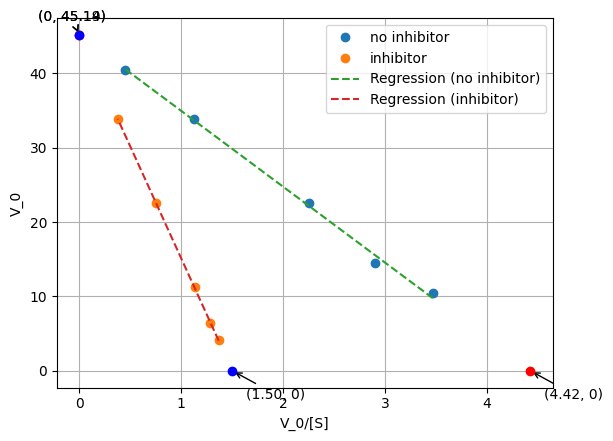

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Example data
s = np.array([3, 5, 10, 30, 90])
v_0 = np.array([10.4, 14.5, 22.5, 33.8, 40.5])
v_0_i = np.array([4.1, 6.4, 11.3, 22.6, 33.8])

# Calculate V_0 / [S] for both cases
v_s_without = v_0 / s
v_s_with = v_0_i / s

# Perform linear regression to fit a line
slope_without, intercept_without = np.polyfit(v_s_without, v_0, 1)
slope_with, intercept_with = np.polyfit(v_s_with, v_0_i, 1)

# Calculate intersection points with x-axis and y-axis
x_intercept_without = -intercept_without / slope_without
y_intercept_without = intercept_without
x_intercept_with = -intercept_with / slope_with
y_intercept_with = intercept_with

# Plot data points
plt.plot(v_s_without, v_0, marker='o', linestyle='', label='no inhibitor')
plt.plot(v_s_with, v_0_i, marker='o', linestyle='', label='inhibitor')

# Plot regression lines
plt.plot(v_s_without, slope_without * v_s_without + intercept_without, linestyle='--', label='Regression (no inhibitor)')
plt.plot(v_s_with, slope_with * v_s_with + intercept_with, linestyle='--', label='Regression (inhibitor)')

# Plot intersection points with x-axis and y-axis
plt.scatter(x_intercept_without, 0, color='red', zorder=5)
plt.scatter(0, y_intercept_without, color='red', zorder=5)
plt.scatter(x_intercept_with, 0, color='blue', zorder=5)
plt.scatter(0, y_intercept_with, color='blue', zorder=5)

plt.annotate(f'({x_intercept_without:.2f}, 0)', (x_intercept_without, 0), xytext=(10, -20),
             textcoords='offset points', arrowprops=dict(arrowstyle="->"))
plt.annotate(f'(0, {y_intercept_without:.2f})', (0, y_intercept_without), xytext=(-30, 10),
             textcoords='offset points', arrowprops=dict(arrowstyle="->"))
plt.annotate(f'({x_intercept_with:.2f}, 0)', (x_intercept_with, 0), xytext=(10, -20),
             textcoords='offset points', arrowprops=dict(arrowstyle="->"))
plt.annotate(f'(0, {y_intercept_with:.2f})', (0, y_intercept_with), xytext=(-30, 10),
             textcoords='offset points', arrowprops=dict(arrowstyle="->"))


# Add labels and title
plt.xlabel('V_0/[S]')
plt.ylabel('V_0')
plt.legend()
plt.grid(True)

# Show plot
plt.show()


##### $OD_{415}$ Against the Concentration of ONP

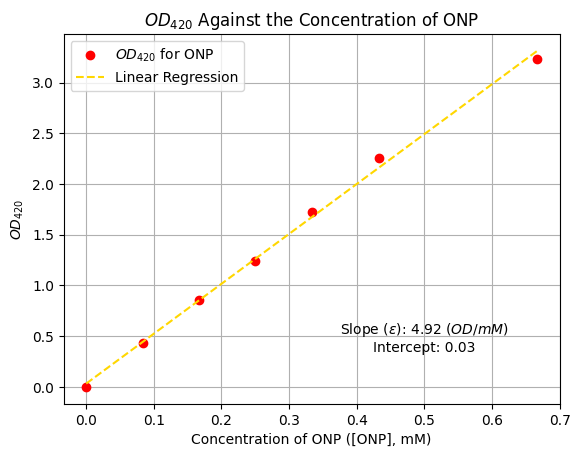

In [20]:
import numpy as np
import matplotlib.pyplot as plt

total_v = 3.0

V_S = np.array([0, 0.25, 0.5, 0.75, 1.0, 1.3, 2.0])

C_S = (1 * V_S) / total_v

OD = np.array([0, 0.428, 0.856, 1.24, 1.723, 2.256, 3.236])

# Perform linear regression to fit a line
slope, intercept = np.polyfit(C_S, OD, 1)

# Calculate intersection points with x-axis and y-axis
x_intercept = -intercept / slope
y_intercept = intercept

# Plot data points
plt.plot(C_S, OD, marker='o', linestyle='', color='red', label='$OD_{420}$ for ONP')

# Plot regression lines
plt.plot(C_S, slope * C_S + intercept, linestyle='--', color='gold', label='Linear Regression')

# # Plot intersection points with x-axis and y-axis
# plt.scatter(x_intercept, 0, color='red', zorder=5)
# plt.scatter(0, y_intercept, color='red', zorder=5)

# plt.annotate(f'({x_intercept:.2f}, 0)', (x_intercept, 0), xytext=(10, -20),
#              textcoords='offset points', arrowprops=dict(arrowstyle="->"))
# plt.annotate(f'(0, {y_intercept:.2f})', (0, y_intercept), xytext=(-30, 10),
#              textcoords='offset points', arrowprops=dict(arrowstyle="->"))

plt.text(0.5, 0.52, f'Slope ($\epsilon$): {slope:.2f} ($OD/mM$)', fontsize=10, ha='center')
plt.text(0.5, 0.35, f'Intercept: {intercept:.2f}', fontsize=10, ha='center')

# Add labels and title
plt.title('$OD_{420}$ Against the Concentration of ONP')
plt.xlabel('Concentration of ONP ([ONP], mM)')
plt.ylabel('$OD_{420}$')
plt.legend()
plt.grid(True)

# Show plot
plt.show()


In [4]:
slope

4.91794977996376

##### ODs against wavelengths (nm)

In [2]:
values = np.arange(385, 470, 5)
len(values)

17

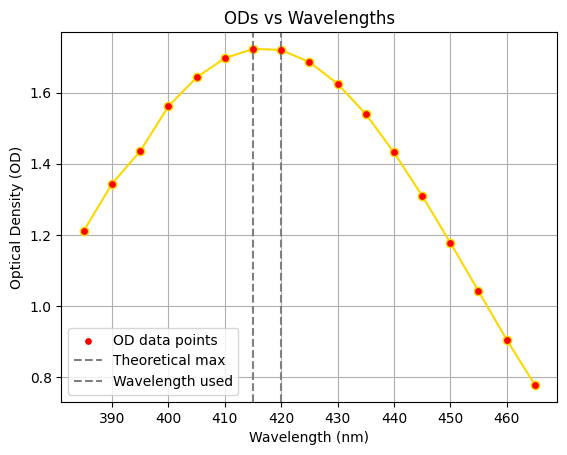

In [17]:
wavelengths = np.array(values)

ODs = np.array([1.212, 1.344, 1.436, 1.562, 1.643, 1.697, 1.723, 1.72, 1.686, 1.625, 1.54, 1.432, 1.31, 1.178, 1.042, 0.905, 0.778])

plt.plot(wavelengths, ODs, marker='o', linestyle='-', color='gold')
plt.scatter(wavelengths, ODs, s=15, color='red', label='OD data points', zorder=5)

max_index = np.argmax(ODs)
plt.axvline(x=415, color='grey', linestyle='--', label=f'Theoretical max')
plt.axvline(x=420, color='grey', linestyle='--', label=f'Wavelength used')


plt.xlabel('Wavelength (nm)')
plt.ylabel('Optical Density (OD)')
plt.title('ODs vs Wavelengths')
plt.legend(loc='lower left')
plt.grid(True)

# Show plot
plt.show()

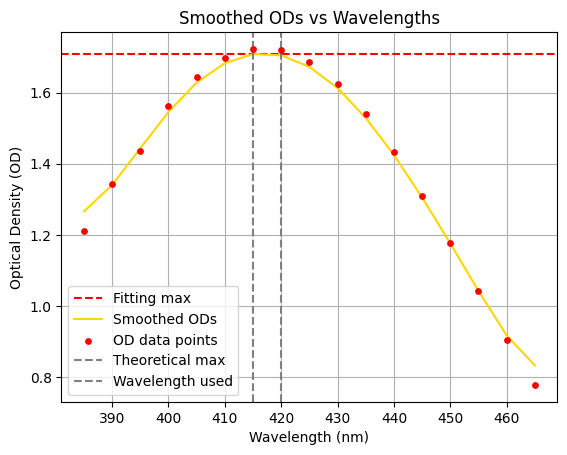

In [14]:
from scipy.ndimage import gaussian_filter1d

# Generate wavelengths array
values = np.arange(385, 470, 5)
wavelengths = np.array(values)

# Example OD data
ODs = np.array([1.212, 1.344, 1.436, 1.562, 1.643, 1.697, 1.723, 1.72, 1.686, 1.625, 1.54, 1.432, 1.31, 1.178, 1.042, 0.905, 0.778])

# Smooth the line using Gaussian filter
smoothed_ODs = gaussian_filter1d(ODs, sigma=1)
max_smooth = max(smoothed_ODs)
plt.axhline(y=max_smooth, color='red', linestyle='--', label=f'Fitting max')

# Plot smoothed data
plt.plot(wavelengths, smoothed_ODs, linestyle='-', color='gold', label='Smoothed ODs')
plt.scatter(wavelengths, ODs, s=15, color='red', label='OD data points', zorder=5)

# Find index of maximum value
max_index = np.argmax(smoothed_ODs)

# Draw vertical dashed line at max value
plt.axvline(x=415, color='grey', linestyle='--', label=f'Theoretical max')
plt.axvline(x=420, color='grey', linestyle='--', label=f'Wavelength used')

# Add labels and title
plt.xlabel('Wavelength (nm)')
plt.ylabel('Optical Density (OD)')
plt.title('Smoothed ODs vs Wavelengths')
plt.legend()
plt.grid(True)

# Show plot
plt.show()

##### ODs against Time Intervals (Enzyme Concentration Varies)

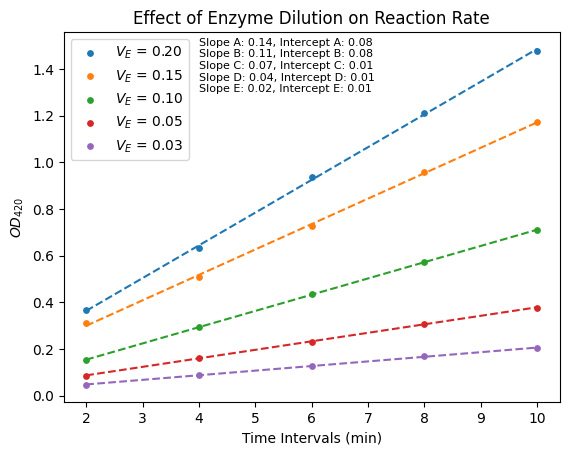

In [112]:
Time_intervals = np.array([2, 4, 6, 8, 10])

Tube_A = np.array([0.365, 0.632, 0.935, 1.213, 1.477])
Tube_B = np.array([0.310, 0.507, 0.727, 0.959, 1.173])
Tube_C = np.array([0.152, 0.294, 0.436, 0.572, 0.709])
Tube_D = np.array([0.086, 0.161, 0.232, 0.308, 0.377])
Tube_E = np.array([0.046, 0.089, 0.128, 0.168, 0.204])

slope_A, intercept_A = np.polyfit(Time_intervals, Tube_A, 1)
slope_B, intercept_B = np.polyfit(Time_intervals, Tube_B, 1)
slope_C, intercept_C = np.polyfit(Time_intervals, Tube_C, 1)
slope_D, intercept_D = np.polyfit(Time_intervals, Tube_D, 1)
slope_E, intercept_E = np.polyfit(Time_intervals, Tube_E, 1)

plt.scatter(Time_intervals, Tube_A, s=15, label='$V_E$ = 0.20', zorder=5)
plt.scatter(Time_intervals, Tube_B, s=15, label='$V_E$ = 0.15', zorder=5)
plt.scatter(Time_intervals, Tube_C, s=15, label='$V_E$ = 0.10', zorder=5)
plt.scatter(Time_intervals, Tube_D, s=15, label='$V_E$ = 0.05', zorder=5)
plt.scatter(Time_intervals, Tube_E, s=15, label='$V_E$ = 0.03', zorder=5)

plt.plot(Time_intervals, slope_A * Time_intervals + intercept_A, linestyle='--')
plt.plot(Time_intervals, slope_B * Time_intervals + intercept_B, linestyle='--')
plt.plot(Time_intervals, slope_C * Time_intervals + intercept_C, linestyle='--')
plt.plot(Time_intervals, slope_D * Time_intervals + intercept_D, linestyle='--')
plt.plot(Time_intervals, slope_E * Time_intervals + intercept_E, linestyle='--')

plt.text(4, 1.50, f'Slope A: {slope_A:.2f}, Intercept A: {intercept_A:.2f}', fontsize=8, ha='left')
plt.text(4, 1.45, f'Slope B: {slope_B:.2f}, Intercept B: {intercept_B:.2f}', fontsize=8, ha='left')
plt.text(4, 1.40, f'Slope C: {slope_C:.2f}, Intercept C: {intercept_C:.2f}', fontsize=8, ha='left')
plt.text(4, 1.35, f'Slope D: {slope_D:.2f}, Intercept D: {intercept_D:.2f}', fontsize=8, ha='left')
plt.text(4, 1.30, f'Slope E: {slope_E:.2f}, Intercept E: {intercept_E:.2f}', fontsize=8, ha='left')

plt.legend()
plt.xlabel('Time Intervals (min)')
plt.ylabel('$OD_{420}$')
plt.title('Effect of Enzyme Dilution on Reaction Rate')

plt.show()


In [114]:
print(slope_A, slope_B, slope_C, slope_D, slope_E)

0.14024999999999999 0.10889999999999998 0.0696 0.03645 0.019749999999999997


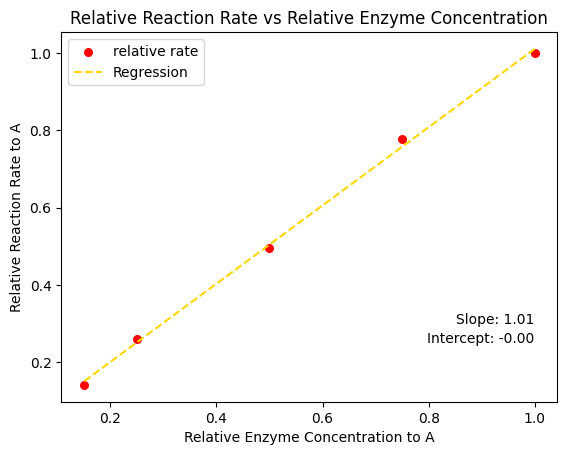

In [116]:
denomianator_rate = slope_A
denomianator_c = 0.20 / 12.0

c_list = np.array([0.20, 0.15, 0.10, 0.05, 0.03]) / 12.0

rate_list = np.array([slope_A, slope_B, slope_C, slope_D, slope_E])

relative_C = c_list / denomianator_c
relative_rate = rate_list / denomianator_rate

slope_re, intercept_re = np.polyfit(relative_C, relative_rate, 1)

plt.scatter(relative_C, relative_rate, color='red',s=30, label='relative rate')
plt.plot(relative_C, slope_re * relative_C + intercept_re, color='gold', linestyle='--', label='Regression')

plt.text(1.0, 0.30, f'Slope: {slope_re:.2f}', fontsize=10, ha='right')
plt.text(1.0, 0.25, f'Intercept: {intercept_re:.2f}', fontsize=10, ha='right')

plt.legend()

plt.xlabel('Relative Enzyme Concentration to A')
plt.ylabel('Relative Reaction Rate to A')
plt.title('Relative Reaction Rate vs Relative Enzyme Concentration')
plt.show()


In [119]:
intercept_re

-0.0024655335119479894

In [120]:
slope_re

1.0134973406659358

In [118]:
relative_rate

array([1.        , 0.77647059, 0.49625668, 0.25989305, 0.14081996])

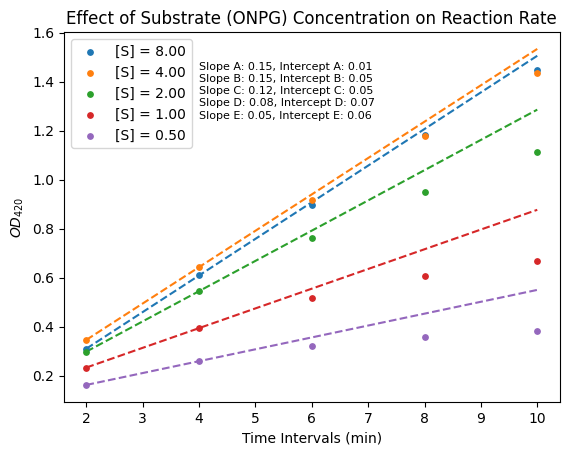

In [57]:
import numpy as np
import matplotlib.pyplot as plt

Time_intervals = np.array([2, 4, 6, 8, 10])

Tube_A = np.array([0.310, 0.609, 0.895, 1.184, 1.449])
Tube_B = np.array([0.346, 0.643, 0.916, 1.177, 1.435])
Tube_C = np.array([0.298, 0.545, 0.760, 0.950, 1.112])
Tube_D = np.array([0.233, 0.394, 0.516, 0.605, 0.667])
Tube_E = np.array([0.162, 0.259, 0.321, 0.358, 0.383])

slope_A, intercept_A = np.polyfit(Time_intervals[:2], Tube_A[:2], 1)
slope_B, intercept_B = np.polyfit(Time_intervals[:2], Tube_B[:2], 1)
slope_C, intercept_C = np.polyfit(Time_intervals[:2], Tube_C[:2], 1)
slope_D, intercept_D = np.polyfit(Time_intervals[:2], Tube_D[:2], 1)
slope_E, intercept_E = np.polyfit(Time_intervals[:2], Tube_E[:2], 1)

plt.scatter(Time_intervals, Tube_A, s=15, label='[S] = 8.00', zorder=5)
plt.scatter(Time_intervals, Tube_B, s=15, label='[S] = 4.00', zorder=5)
plt.scatter(Time_intervals, Tube_C, s=15, label='[S] = 2.00', zorder=5)
plt.scatter(Time_intervals, Tube_D, s=15, label='[S] = 1.00', zorder=5)
plt.scatter(Time_intervals, Tube_E, s=15, label='[S] = 0.50', zorder=5)

plt.plot(Time_intervals, slope_A * Time_intervals + intercept_A, linestyle='--')
plt.plot(Time_intervals, slope_B * Time_intervals + intercept_B, linestyle='--')
plt.plot(Time_intervals, slope_C * Time_intervals + intercept_C, linestyle='--')
plt.plot(Time_intervals, slope_D * Time_intervals + intercept_D, linestyle='--')
plt.plot(Time_intervals, slope_E * Time_intervals + intercept_E, linestyle='--')

plt.text(4, 1.45, f'Slope A: {slope_A:.2f}, Intercept A: {intercept_A:.2f}', fontsize=8, ha='left')
plt.text(4, 1.40, f'Slope B: {slope_B:.2f}, Intercept B: {intercept_B:.2f}', fontsize=8, ha='left')
plt.text(4, 1.35, f'Slope C: {slope_C:.2f}, Intercept C: {intercept_C:.2f}', fontsize=8, ha='left')
plt.text(4, 1.30, f'Slope D: {slope_D:.2f}, Intercept D: {intercept_D:.2f}', fontsize=8, ha='left')
plt.text(4, 1.25, f'Slope E: {slope_E:.2f}, Intercept E: {intercept_E:.2f}', fontsize=8, ha='left')

plt.legend()
plt.xlabel('Time Intervals (min)')
plt.ylabel('$OD_{420}$')
plt.title('Effect of Substrate (ONPG) Concentration on Reaction Rate')

plt.show()


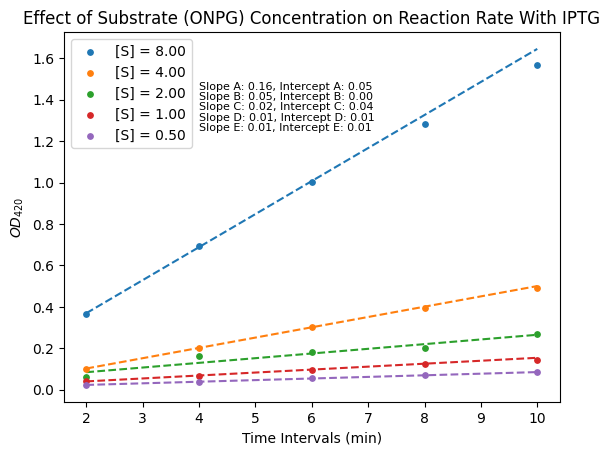

In [98]:
import numpy as np
import matplotlib.pyplot as plt

Time_intervals = np.array([2, 4, 6, 8, 10])

Tube_A_with = np.array([0.367, 0.693, 1.005, 1.282, 1.568])
Tube_B_with = np.array([0.102, 0.202, 0.301, 0.395, 0.489])
Tube_C_with = np.array([0.059, 0.163, 0.183, 0.203, 0.269 ])
Tube_D_with = np.array([0.040, 0.068, 0.097, 0.124, 0.143])
Tube_E_with = np.array([0.023, 0.038, 0.054, 0.069, 0.083])

slope_A_with, intercept_A_with = np.polyfit(Time_intervals[:3], Tube_A_with[:3], 1)
slope_B_with, intercept_B_with = np.polyfit(Time_intervals[:3], Tube_B_with[:3], 1)
slope_C_with, intercept_C_with = np.polyfit(Time_intervals[:4], Tube_C_with[:4], 1)
slope_D_with, intercept_D_with = np.polyfit(Time_intervals[:3], Tube_D_with[:3], 1)
slope_E_with, intercept_E_with = np.polyfit(Time_intervals[:3], Tube_E_with[:3], 1)

plt.scatter(Time_intervals, Tube_A_with, s=15, label='[S] = 8.00', zorder=5)
plt.scatter(Time_intervals, Tube_B_with, s=15, label='[S] = 4.00', zorder=5)
plt.scatter(Time_intervals, Tube_C_with, s=15, label='[S] = 2.00', zorder=5)
plt.scatter(Time_intervals, Tube_D_with, s=15, label='[S] = 1.00', zorder=5)
plt.scatter(Time_intervals, Tube_E_with, s=15, label='[S] = 0.50', zorder=5)

plt.plot(Time_intervals, slope_A_with * Time_intervals + intercept_A_with, linestyle='--')
plt.plot(Time_intervals, slope_B_with * Time_intervals + intercept_B_with, linestyle='--')
plt.plot(Time_intervals, slope_C_with * Time_intervals + intercept_C_with, linestyle='--')
plt.plot(Time_intervals, slope_D_with * Time_intervals + intercept_D_with, linestyle='--')
plt.plot(Time_intervals, slope_E_with * Time_intervals + intercept_E_with, linestyle='--')

plt.text(4, 1.45, f'Slope A: {slope_A_with:.2f}, Intercept A: {intercept_A_with:.2f}', fontsize=8, ha='left')
plt.text(4, 1.40, f'Slope B: {slope_B_with:.2f}, Intercept B: {intercept_B_with:.2f}', fontsize=8, ha='left')
plt.text(4, 1.35, f'Slope C: {slope_C_with:.2f}, Intercept C: {intercept_C_with:.2f}', fontsize=8, ha='left')
plt.text(4, 1.30, f'Slope D: {slope_D_with:.2f}, Intercept D: {intercept_D_with:.2f}', fontsize=8, ha='left')
plt.text(4, 1.25, f'Slope E: {slope_E_with:.2f}, Intercept E: {intercept_E_with:.2f}', fontsize=8, ha='left')

plt.legend()
plt.xlabel('Time Intervals (min)')
plt.ylabel('$OD_{420}$')
plt.title('Effect of Substrate (ONPG) Concentration on Reaction Rate With IPTG')

plt.show()


In [99]:
import numpy as np
import matplotlib.pyplot as plt

epsilon = slope

OD_min = list([slope_A, slope_B, slope_C, slope_D, slope_E])
OD_min_with = list([slope_A_with, slope_B_with, slope_C_with, slope_D_with, slope_E_with])

# V0 and V0_with's unit: mM/min
V0 = OD_min / epsilon
V0_with = OD_min_with / epsilon

inverse_V0 =  1/V0
inverse_V0_with = 1/V0_with

# Unit: mM
V_s = np.array([8.0, 4.0, 2.0, 1.0, 0.5])
S = ((V_s * 3.3) / 12)
inverse_S = 1/S

In [107]:
V0 * 1000

array([30.39884641, 30.19550964, 25.11209051, 16.3686096 ,  9.86183312])

In [108]:
V0_with

array([0.03243221, 0.010116  , 0.00459541, 0.00289755, 0.00157586])

In [109]:
S

array([2.2   , 1.1   , 0.55  , 0.275 , 0.1375])

In [110]:
epsilon

4.91794977996376

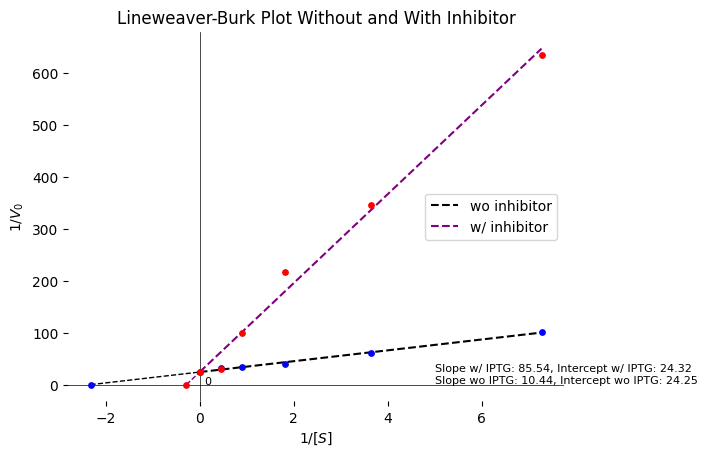

In [100]:
slope_wo_IPTG, intercept_wo_IPTG = np.polyfit(inverse_S, inverse_V0, 1)
slope_w_IPTG, intercept_w_IPTG = np.polyfit(inverse_S, inverse_V0_with, 1)

x_intercept_wo_IPTG = -intercept_wo_IPTG / slope_wo_IPTG
y_intercept_wo_IPTG = intercept_wo_IPTG
x_intercept_w_IPTG = -intercept_w_IPTG / slope_w_IPTG
y_intercept_w_IPTG = intercept_w_IPTG

x_extension_wo_IPTG = np.array([x_intercept_wo_IPTG, 0])
y_extension_wo_IPTG = np.array([0, intercept_wo_IPTG])
x_extension_w_IPTG = np.array([x_intercept_w_IPTG, 0])
y_extension_w_IPTG = np.array([0, intercept_w_IPTG])

plt.scatter(inverse_S, inverse_V0, s=15, zorder=5, color = 'blue')
plt.scatter(inverse_S, inverse_V0_with, s=15, zorder=5, color = 'red')

plt.plot(np.insert(inverse_S, 0, 0), slope_wo_IPTG * np.insert(inverse_S, 0, 0) + intercept_wo_IPTG, 
         linestyle='--', label = 'wo inhibitor', color = 'black')
plt.plot(np.insert(inverse_S, 0, 0), slope_w_IPTG * np.insert(inverse_S, 0, 0) + intercept_w_IPTG, 
         linestyle='--', label = 'w/ inhibitor', color = 'purple')

# plt.xlim(0, 0.01)
# plt.ylim(-0.05, 0.2)

# Hide tick marks and labels on axes
# plt.xticks([])
# plt.yticks([])

# Draw x-y axis lines
plt.axhline(0, color='black', linewidth=0.5)
plt.axvline(0, color='black', linewidth=0.5)

# Add index labels for axes
plt.text(0.1, -0.02, '0', fontsize=8)

# Remove border
for spine in plt.gca().spines.values():
    spine.set_visible(False)

# Plot extension of regression line with another color
plt.plot(x_extension_wo_IPTG, y_extension_wo_IPTG, color='black', linestyle='--', linewidth=1)
plt.plot(x_extension_w_IPTG, y_extension_w_IPTG, color='purple', linestyle='--', linewidth=1)


plt.text(5, 2, f'Slope wo IPTG: {slope_wo_IPTG:.2f}, Intercept wo IPTG: {intercept_wo_IPTG:.2f}', fontsize=8, ha='left')
plt.text(5, 25, f'Slope w/ IPTG: {slope_w_IPTG:.2f}, Intercept w/ IPTG: {intercept_w_IPTG:.2f}', fontsize=8, ha='left')

plt.scatter(x_intercept_wo_IPTG, 0, color='blue', zorder=5, s = 15)
plt.scatter(0, y_intercept_wo_IPTG, color='blue', zorder=5, s = 15)
plt.scatter(x_intercept_w_IPTG, 0, color='red', zorder=5, s = 15)
plt.scatter(0, y_intercept_w_IPTG, color='red', zorder=5, s = 15)

# plt.annotate(f'({x_intercept_wo_IPTG:.2f}, 0)', (x_intercept_wo_IPTG, 0), xytext=(10, -20),
#              textcoords='offset points', arrowprops=dict(arrowstyle="->"))
# plt.annotate(f'(0, {y_intercept_wo_IPTG:.2f})', (0, y_intercept_wo_IPTG), xytext=(-30, 10),
#              textcoords='offset points', arrowprops=dict(arrowstyle="->"))
# plt.annotate(f'({x_intercept_w_IPTG:.2f}, 0)', (x_intercept_wo_IPTG, 0), xytext=(10, -20),
#              textcoords='offset points', arrowprops=dict(arrowstyle="->"))
# plt.annotate(f'(0, {y_intercept_w_IPTG:.2f})', (0, y_intercept_wo_IPTG), xytext=(-30, 10),
#              textcoords='offset points', arrowprops=dict(arrowstyle="->"))

plt.legend()
plt.xlabel('$1/[S]$')
plt.ylabel('$1/V_0$')
plt.title('Lineweaver-Burk Plot Without and With Inhibitor')

plt.show()

In [102]:
k_m = 1/x_intercept_wo_IPTG
k_m

-0.430371886283266

In [103]:
k_app = 1/x_intercept_w_IPTG
k_app

-3.516887857974328

In [104]:
C_I = (5.5 * 1) / 12
C_I

0.4583333333333333

In [105]:
k_i = (1 / ((k_app / k_m) - 1)) * C_I
k_i

0.06390823278490627

In [106]:
print('Vmax wo', 1/intercept_wo_IPTG)
print('Vmax w/', 1/intercept_w_IPTG)
print('Km', slope_wo_IPTG / intercept_wo_IPTG)
print('Km\'', slope_w_IPTG / intercept_w_IPTG)

Vmax wo 0.041234272100093894
Vmax w/ 0.04111274588938404
Km 0.430371886283266
Km' 3.5168878579743277
